In [1]:
import pandas as pd
from rdkit import Chem
import seaborn as sns
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt


# Combining data

Combining datasets

In [2]:
# drop the rest 
keep_cols_all = ["CANONICAL_SMILES", "INCHIKEY", "active", "dataset", "data_type", "common_name", "action_type"]


# AID 1347003

In [3]:
aid1347033 = pd.read_csv("processed/AID_1347033.csv")

In [4]:
aid1347033.head()

,CANONICAL_SMILES,INCHIKEY,PUBCHEM_ACTIVITY_OUTCOME,PUBCHEM_CID,dataset,data_type,active,common_name,action_type
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,Active,10219.0,aid1347033,assay,True,NaN,agonist
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,Active,6708701.0,aid1347033,assay,True,NaN,agonist
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,Active,7594.0,aid1347033,assay,True,NaN,agonist
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,Active,156414.0,aid1347033,assay,True,NaN,agonist
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,Active,5280443.0,aid1347033,assay,True,NaN,agonist


In [5]:
aid1347033_actives = aid1347033.query("active == True")
aid1347033_actives = aid1347033_actives[keep_cols_all]
aid1347033_actives

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
...,...,...,...,...,...,...,...
2072,ClC1=C(Cl)C2(Cl)C3C(Cl)C=CC3C1(Cl)C2(Cl)Cl,FRCCEHPWNOQAEU-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
2073,O=C(CCc1ccc(O)cc1)c1c(O)cc(O)cc1O,VGEREEWJJVICBM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
2074,Brc1ccc(Oc2ccccc2)cc1,JDUYPUMQALQRCN-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist
2075,CCCCCCCCCOCC1CO1,KEKXMAURKVLACV-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist


# AID 434939

In [6]:
aid434939 = pd.read_csv("./processed/AID_434939.csv")

In [7]:
aid434939_actives = aid434939.query("active == True")
aid434939_actives = aid434939_actives[keep_cols_all]

In [8]:
aid434939_actives

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type
0,CCn1c2ccccc2c2cc(NC(=O)CSc3nnnn3-c3ccccc3)ccc21,PKWBGMCLPVXLSO-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist
1,Cc1cccc(C(=O)NC(C(=O)Nc2ncc(C)s2)C(C)C)c1,ASGCTENTJVTZBM-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist
2,COc1ccccc1-c1sc2cc3c(cc2c1C#CC1(O)CCCCC1)OCO3,KAIBRZZQPOEOOJ-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist
3,C=C1C(=O)O[C@@H]2C[C@@H](C)C3=CCC(=O)[C@@]3(C)...,YUHGCHCTADWTAC-LAIRZBGTSA-N,True,aid434939,assay,NaN,agonist
4,Cn1cccc1/C=N/n1c(-c2ccc(C(C)(C)C)cc2)n[nH]c1=S,GGKUFTYXGKDNBZ-XDHOZWIPSA-N,True,aid434939,assay,NaN,agonist
...,...,...,...,...,...,...,...
2012,CN(C)c1ccc(/C=N\NC(=O)c2csnn2)cc1,GFRVDRMYBYYYSE-QPEQYQDCSA-N,True,aid434939,assay,NaN,agonist
2013,Cc1c(C(=O)N/N=C/C(C)C)[nH]c2c([N+](=O)[O-])cccc12,NWCXILSGOZBVPS-VIZOYTHASA-N,True,aid434939,assay,NaN,agonist
2014,N=C1S/C(=C\c2ccco2)C(=O)N1c1nccs1,RJHAJQSWEUEPCY-FFIYZWDUSA-N,True,aid434939,assay,NaN,agonist
2015,O=C1c2ccccc2C(=O)N1CCc1ccccn1,XDSOQPQMYBPJND-UHFFFAOYSA-N,True,aid434939,assay,NaN,agonist


# AID 720659

In [9]:
aid720659 = pd.read_csv("./processed/AID_720659.csv")

In [10]:
aid720659_actives = aid720659.query("active == True")
aid720659_actives = aid720659_actives[keep_cols_all]

# Chembl

There is only a single set of compounds in ChEMBL with substrate activity explicitly marked 



In [11]:
chembl_actives = pd.read_csv("processed/chembl_active_selected.csv")
chembl_actives.head()

,CANONICAL_SMILES,INCHIKEY,pChEMBL mean,pChEMBL std,common_name,appears_in_N_ChEMBL_assays,action_type,dataset,active
0,CO[C@H]1/C=C/O[C@@]2(C)Oc3c(C)c(O)c4c(O)c(c(C=...,JQXXHWHPUNPDRT-ANMDCUJZSA-N,5.691429,0.601732,RIFAMPIN,9,agonist,ChEMBL_curated,True
1,O=S(=O)(c1ccccc1)N(CC(F)(F)F)c1ccc(C(O)(C(F)(F...,SGIWFELWJPNFDH-UHFFFAOYSA-N,7.556667,0.414037,T091317,6,inhibitor,ChEMBL_curated,True
2,COc1cc(C(=O)NS(=O)(=O)c2ccccc2C)ccc1Cc1cn(C)c2...,YEEZWCHGZNKEEK-UHFFFAOYSA-N,5.500000,0.708837,ZAFIRLUKAST,6,NaN,ChEMBL_curated,True
3,COC(=O)C1=C(C#N)N=C(C)C(C(=O)OC(C)C)C1c1cccc([...,KJWGEXJCWCYEMI-UHFFFAOYSA-N,5.912000,0.187270,NILVADIPINE,6,NaN,ChEMBL_curated,True
4,CC(C)(ON=C(C(=O)NC1C(=O)N2C(C(=O)[O-])=C(C[n+]...,ORFOPKXBNMVMKC-XPKAQORNSA-N,6.620000,0.183848,CEFTAZIDIME,5,NaN,ChEMBL_curated,True


# FDA approved

Compounds the FDA really reccomends you try

In [12]:
fda = pd.read_csv("./FDA/fda.csv")

In [13]:
fda

,CANONICAL_SMILES,active,common_name,action_type,FDA_recommended,dataset,INCHIKEY
0,C[C@H]1/C=C/C=C(\C(=O)NC2=C(C(=C3C(=C2O)C(=C(C...,True,rifampicin,agonist,True,FDA,JQXXHWHPUNPDRT-WLSIYKJHSA-N
1,C1=CC=C2C(=C1)C=CC3=CC=CC=C3N2C(=O)N,True,carbamazepine,agonist,True,FDA,FFGPTBGBLSHEPO-UHFFFAOYSA-N
2,C1=CC=C(C=C1)C2(C(=O)NC(=O)N2)C3=CC=CC=C3,True,phenytoin,agonist,True,FDA,CXOFVDLJLONNDW-UHFFFAOYSA-N


# Flockheart table

In [14]:
flockheart = pd.read_csv("./processed/flockheart.csv")
flockheart.drop(columns="SMILES", inplace=True)

# Combine everything


## NOTE

common name being blank is not that these compounds do not have a common name, but that they need to be pulled from pubchem

In [15]:
combined_literature = pd.concat([aid1347033_actives, aid434939_actives, aid720659_actives, fda, flockheart, chembl_actives])
combined_literature

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended,pChEMBL mean,pChEMBL std,appears_in_N_ChEMBL_assays
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
572,COC(=O)CN(c1ccc([Si](C)(C)O)cc1)S(=O)(=O)c1ccccc1,CHADRLVAUQMLCQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.85,NaN,1.0
573,CS(=O)(=O)c1ccc(C#N)cc1C(=O)N1CCC(N(C2CC2)S(=O...,UKVXALXNKRQBET-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.30,NaN,1.0
574,COc1ccc2c(c1)C1CC1(C(=O)N1C3CCC1CNC3)Cn1c-2c(C...,UCNRDEOTNRRDSE-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.05,NaN,1.0
575,O=C(CC1CN(S(=O)(=O)c2ccc(F)cc2)c2ccc(C(O)(C(F)...,YOFKGHWSZHDQNO-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,6.60,NaN,1.0


In [16]:
# combined_literature["FDA_recommended"] = combined_literature["FDA_recommended"].fillna(False)

In [17]:
combined_literature.INCHIKEY.duplicated().sum()  # close same result with SMILES

np.int64(721)

In [18]:
combined_literature.dropna(subset="INCHIKEY", inplace=True)

In [19]:
combined_literature_chembl = pd.concat([combined_literature, chembl_actives])

In [20]:
combined_literature_chembl.FDA_recommended.value_counts()

FDA_recommended
True    3
Name: count, dtype: int64

In [21]:
combined_literature_chembl.dataset.value_counts()

dataset
aid1347033        2052
aid434939         2017
ChEMBL_curated    1154
aid720659          263
flockheart          24
FDA                  3
Name: count, dtype: int64

In [22]:
combined_literature_chembl.INCHIKEY.duplicated().sum()

np.int64(1272)

In [23]:
combined_literature_chembl.INCHIKEY.isna().sum()

np.int64(0)

In [24]:
combined_literature_chembl

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended,pChEMBL mean,pChEMBL std,appears_in_N_ChEMBL_assays
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
572,COC(=O)CN(c1ccc([Si](C)(C)O)cc1)S(=O)(=O)c1ccccc1,CHADRLVAUQMLCQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.85,NaN,1.0
573,CS(=O)(=O)c1ccc(C#N)cc1C(=O)N1CCC(N(C2CC2)S(=O...,UKVXALXNKRQBET-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.30,NaN,1.0
574,COc1ccc2c(c1)C1CC1(C(=O)N1C3CCC1CNC3)Cn1c-2c(C...,UCNRDEOTNRRDSE-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.05,NaN,1.0
575,O=C(CC1CN(S(=O)(=O)c2ccc(F)cc2)c2ccc(C(O)(C(F)...,YOFKGHWSZHDQNO-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,6.60,NaN,1.0


In [25]:
appears = combined_literature_chembl.groupby("INCHIKEY")["dataset"].nunique().reset_index(name="appears_in_N_datasets")
appears.set_index("INCHIKEY")

,appears_in_N_datasets
INCHIKEY,
AADCDMQTJNYOSS-LBPRGKRZSA-N,1
AADOHPJLNNJGGG-UHFFFAOYSA-N,1
AAEVYOVXGOFMJO-UHFFFAOYSA-N,2
AAKJLRGGTJKAMG-UHFFFAOYSA-N,1
AAMLNGFXXMFRGH-HYARGMPZSA-N,1
...,...
ZZMVLMVFYMGSMY-UHFFFAOYSA-N,1
ZZPYRWQPKUSUJH-UHFFFAOYSA-N,1
ZZRDAWZXJBVQSO-UHFFFAOYSA-N,1


In [26]:
appears.isna().sum()

INCHIKEY                 0
appears_in_N_datasets    0
dtype: int64

<Axes: xlabel='appears_in_N_datasets', ylabel='count'>

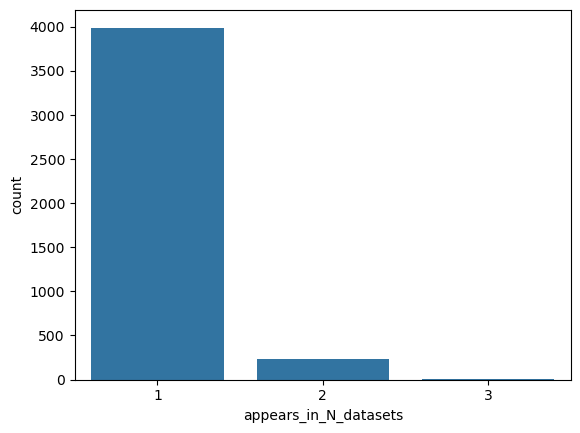

In [27]:
sns.countplot(data=appears, x="appears_in_N_datasets")

In [28]:
combined_literature_chembl_w_counts = combined_literature_chembl.merge(appears, on="INCHIKEY")
combined_literature_chembl_w_counts

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended,pChEMBL mean,pChEMBL std,appears_in_N_ChEMBL_assays,appears_in_N_datasets
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...
5508,COC(=O)CN(c1ccc([Si](C)(C)O)cc1)S(=O)(=O)c1ccccc1,CHADRLVAUQMLCQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.85,NaN,1.0,1
5509,CS(=O)(=O)c1ccc(C#N)cc1C(=O)N1CCC(N(C2CC2)S(=O...,UKVXALXNKRQBET-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.30,NaN,1.0,1
5510,COc1ccc2c(c1)C1CC1(C(=O)N1C3CCC1CNC3)Cn1c-2c(C...,UCNRDEOTNRRDSE-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.05,NaN,1.0,1
5511,O=C(CC1CN(S(=O)(=O)c2ccc(F)cc2)c2ccc(C(O)(C(F)...,YOFKGHWSZHDQNO-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,6.60,NaN,1.0,1


In [29]:
df_dummies = pd.get_dummies(combined_literature_chembl_w_counts['dataset'], prefix='dataset').join(combined_literature_chembl_w_counts["INCHIKEY"])
df_dummies

,dataset_ChEMBL_curated,dataset_FDA,dataset_aid1347033,dataset_aid434939,dataset_aid720659,dataset_flockheart,INCHIKEY
0,False,False,True,False,False,False,AUVVAXYIELKVAI-CKBKHPSWSA-N
1,False,False,True,False,False,False,DHZBEENLJMYSHQ-OBDNUKKESA-N
2,False,False,True,False,False,False,OWRCNXZUPFZXOS-UHFFFAOYSA-N
3,False,False,True,False,False,False,OMZCMEYTWSXEPZ-UHFFFAOYSA-N
4,False,False,True,False,False,False,KZNIFHPLKGYRTM-UHFFFAOYSA-N
...,...,...,...,...,...,...,...
5508,True,False,False,False,False,False,CHADRLVAUQMLCQ-UHFFFAOYSA-N
5509,True,False,False,False,False,False,UKVXALXNKRQBET-UHFFFAOYSA-N
5510,True,False,False,False,False,False,UCNRDEOTNRRDSE-UHFFFAOYSA-N
5511,True,False,False,False,False,False,YOFKGHWSZHDQNO-UHFFFAOYSA-N


In [30]:
df_result = df_dummies.groupby('INCHIKEY').max().reset_index()
df_result = df_result.set_index("INCHIKEY")

In [31]:
# cat_dataname = combined_literature_chembl.groupby("INCHIKEY")["dataset"].apply(lambda x: "_+_".join(x)).reset_index(name="dataset_comb").set_index("INCHIKEY")
# cat_dataname

In [32]:
combined_literature_chembl_w_counts = combined_literature_chembl_w_counts.merge(df_result, on="INCHIKEY")
combined_literature_chembl_w_counts

,CANONICAL_SMILES,INCHIKEY,active,dataset,data_type,common_name,action_type,FDA_recommended,pChEMBL mean,pChEMBL std,appears_in_N_ChEMBL_assays,appears_in_N_datasets,dataset_ChEMBL_curated,dataset_FDA,dataset_aid1347033,dataset_aid434939,dataset_aid720659,dataset_flockheart
0,CC[C@H]1CN2CCc3cc(OC)c(OC)cc3[C@@H]2C[C@@H]1C[...,AUVVAXYIELKVAI-CKBKHPSWSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1,False,False,True,False,False,False
1,C[C@@]12C(=O)OC(=O)[C@]1(C)C1CCC2O1,DHZBEENLJMYSHQ-OBDNUKKESA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1,False,False,True,False,False,False
2,N=C(Nc1ccccc1)Nc1ccccc1,OWRCNXZUPFZXOS-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1,False,False,True,False,False,False
3,C=CC(=O)Nc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1OCCCN...,OMZCMEYTWSXEPZ-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,1,False,False,True,False,False,False
4,O=c1cc(-c2ccc(O)cc2)oc2cc(O)cc(O)c12,KZNIFHPLKGYRTM-UHFFFAOYSA-N,True,aid1347033,assay,NaN,agonist,NaN,NaN,NaN,NaN,2,False,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5508,COC(=O)CN(c1ccc([Si](C)(C)O)cc1)S(=O)(=O)c1ccccc1,CHADRLVAUQMLCQ-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.85,NaN,1.0,1,True,False,False,False,False,False
5509,CS(=O)(=O)c1ccc(C#N)cc1C(=O)N1CCC(N(C2CC2)S(=O...,UKVXALXNKRQBET-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.30,NaN,1.0,1,True,False,False,False,False,False
5510,COc1ccc2c(c1)C1CC1(C(=O)N1C3CCC1CNC3)Cn1c-2c(C...,UCNRDEOTNRRDSE-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,5.05,NaN,1.0,1,True,False,False,False,False,False
5511,O=C(CC1CN(S(=O)(=O)c2ccc(F)cc2)c2ccc(C(O)(C(F)...,YOFKGHWSZHDQNO-UHFFFAOYSA-N,True,ChEMBL_curated,NaN,NaN,NaN,NaN,6.60,NaN,1.0,1,True,False,False,False,False,False


In [33]:
combined_literature_chembl_w_counts.action_type.value_counts()

action_type
agonist            4529
activator           152
inhibitor            76
inverse agonist      76
antagonist           62
binding agent        12
Name: count, dtype: int64

In [34]:
combined_literature_chembl_w_counts.INCHIKEY.nunique()

4241

In [35]:
combined_literature_chembl_w_counts['common_name'].isna().sum()

np.int64(5196)

In [36]:
# we can just sort by N_datasets as no specific chembl curation to get all the chembl data at the top, then uniquify on INCHIKEY

combined_literature_chembl_w_counts.sort_values(["appears_in_N_ChEMBL_assays", "appears_in_N_datasets"], ascending=[False,False],  inplace=True)


In [37]:
# fill common name from gropupby 
combined_literature_chembl_w_counts['common_name'] = combined_literature_chembl_w_counts.groupby('INCHIKEY')['common_name'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


/tmp/ipykernel_99399/1877288904.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  combined_literature_chembl_w_counts['common_name'] = combined_literature_chembl_w_counts.groupby('INCHIKEY')['common_name'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))
/tmp/ipykernel_99399/1877288904.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  combined_literature_chembl_w_counts['common_name'] = combined_literature_chembl_w_counts.groupby('INCHIKEY')['common_name'].transform(lambda x: x.fillna(method='ffill').fillna(method='bfill'))


In [38]:
combined_literature_chembl_w_counts['common_name'].isna().sum()

np.int64(5100)

In [39]:
combined_literature_chembl_w_counts.drop(columns=["dataset","data_type"], inplace=True)

In [40]:
combined_literature_chembl_w_counts.head()

,CANONICAL_SMILES,INCHIKEY,active,common_name,action_type,FDA_recommended,pChEMBL mean,pChEMBL std,appears_in_N_ChEMBL_assays,appears_in_N_datasets,dataset_ChEMBL_curated,dataset_FDA,dataset_aid1347033,dataset_aid434939,dataset_aid720659,dataset_flockheart
4359,CO[C@H]1/C=C/O[C@@]2(C)Oc3c(C)c(O)c4c(O)c(c(C=...,JQXXHWHPUNPDRT-ANMDCUJZSA-N,True,RIFAMPIN,agonist,NaN,5.691429,0.601732,9.0,3,True,False,False,False,True,True
4936,CO[C@H]1/C=C/O[C@@]2(C)Oc3c(C)c(O)c4c(O)c(c(C=...,JQXXHWHPUNPDRT-ANMDCUJZSA-N,True,RIFAMPIN,agonist,NaN,5.691429,0.601732,9.0,3,True,False,False,False,True,True
4361,COc1cc(C(=O)NS(=O)(=O)c2ccccc2C)ccc1Cc1cn(C)c2...,YEEZWCHGZNKEEK-UHFFFAOYSA-N,True,ZAFIRLUKAST,NaN,NaN,5.500000,0.708837,6.0,2,True,False,True,False,False,False
4938,COc1cc(C(=O)NS(=O)(=O)c2ccccc2C)ccc1Cc1cn(C)c2...,YEEZWCHGZNKEEK-UHFFFAOYSA-N,True,ZAFIRLUKAST,NaN,NaN,5.500000,0.708837,6.0,2,True,False,True,False,False,False
4360,O=S(=O)(c1ccccc1)N(CC(F)(F)F)c1ccc(C(O)(C(F)(F...,SGIWFELWJPNFDH-UHFFFAOYSA-N,True,T091317,inhibitor,NaN,7.556667,0.414037,6.0,1,True,False,False,False,False,False


In [41]:
fda_reccomends_mask = combined_literature_chembl_w_counts.INCHIKEY.isin(fda.INCHIKEY)

fda_reccomends_mask

4359    False
4936    False
4361    False
4938    False
4360    False
        ...  
4349    False
4352    False
4355    False
4356    False
4358    False
Name: INCHIKEY, Length: 5513, dtype: bool

In [42]:
# combined_literature_chembl_w_counts["FDA_recommended"] = combined_literature_chembl_w_counts["FDA_recommended"][fda_reccomends_mask] = True

In [43]:
combined_literature_chembl_w_counts["FDA_recommended"] = fda_reccomends_mask

In [44]:
combined_literature_chembl_w_counts.drop_duplicates(subset="INCHIKEY", inplace=True)

In [45]:
combined_literature_chembl_w_counts["action_type"] = combined_literature_chembl_w_counts["action_type"].fillna("agonist")

In [46]:
combined_literature_chembl_w_counts["inclusion_score"] = combined_literature_chembl_w_counts["appears_in_N_ChEMBL_assays"].fillna(0) + combined_literature_chembl_w_counts["appears_in_N_datasets"].fillna(0)

In [47]:
combined_literature_chembl_w_counts.sort_values("inclusion_score", ascending=False, inplace=True)

In [48]:
combined_literature_chembl_w_counts.to_csv("final/actives_final.csv", index=False)

In [49]:
combined_literature_chembl_w_counts

,CANONICAL_SMILES,INCHIKEY,active,common_name,action_type,FDA_recommended,pChEMBL mean,pChEMBL std,appears_in_N_ChEMBL_assays,appears_in_N_datasets,dataset_ChEMBL_curated,dataset_FDA,dataset_aid1347033,dataset_aid434939,dataset_aid720659,dataset_flockheart,inclusion_score
4359,CO[C@H]1/C=C/O[C@@]2(C)Oc3c(C)c(O)c4c(O)c(c(C=...,JQXXHWHPUNPDRT-ANMDCUJZSA-N,True,RIFAMPIN,agonist,False,5.691429,0.601732,9.0,3,True,False,False,False,True,True,12.0
4361,COc1cc(C(=O)NS(=O)(=O)c2ccccc2C)ccc1Cc1cn(C)c2...,YEEZWCHGZNKEEK-UHFFFAOYSA-N,True,ZAFIRLUKAST,agonist,False,5.500000,0.708837,6.0,2,True,False,True,False,False,False,8.0
4365,C=C[C@@]1(C)CC(=O)[C@]2(O)[C@@]3(C)[C@@H](O)CC...,OHCQJHSOBUTRHG-KGGHGJDLSA-N,True,COLFORSIN,agonist,False,5.173333,0.365559,5.0,3,True,False,True,False,True,False,8.0
4360,O=S(=O)(c1ccccc1)N(CC(F)(F)F)c1ccc(C(O)(C(F)(F...,SGIWFELWJPNFDH-UHFFFAOYSA-N,True,T091317,inhibitor,False,7.556667,0.414037,6.0,1,True,False,False,False,False,False,7.0
4362,COC(=O)C1=C(C#N)N=C(C)C(C(=O)OC(C)C)C1c1cccc([...,KJWGEXJCWCYEMI-UHFFFAOYSA-N,True,NILVADIPINE,agonist,False,5.912000,0.187270,6.0,1,True,False,False,False,False,False,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1714,CCc1cc(C(C)(C)C)c(O)c(C(C)(C)C)c1,BVUXDWXKPROUDO-UHFFFAOYSA-N,True,NaN,agonist,False,NaN,NaN,NaN,1,False,False,True,False,False,False,1.0
1720,Nc1c(Br)cc([N+](=O)[O-])cc1[N+](=O)[O-],KWMDHCLJYMVBNS-UHFFFAOYSA-N,True,NaN,agonist,False,NaN,NaN,NaN,1,False,False,True,False,False,False,1.0
1722,O=C(c1ccccc1)c1ccc(O)cc1O,ZXDDPOHVAMWLBH-UHFFFAOYSA-N,True,NaN,agonist,False,NaN,NaN,NaN,1,False,False,True,False,False,False,1.0
1724,CCCCCCCCOc1ccc(C(=O)O)cc1,IALWCYFULVHLEC-UHFFFAOYSA-N,True,NaN,agonist,False,NaN,NaN,NaN,1,False,False,True,False,False,False,1.0


In [50]:
combined_literature_chembl_w_counts["inclusion_score"] = combined_literature_chembl_w_counts["inclusion_score"].astype(int)

<Axes: xlabel='inclusion_score', ylabel='count'>

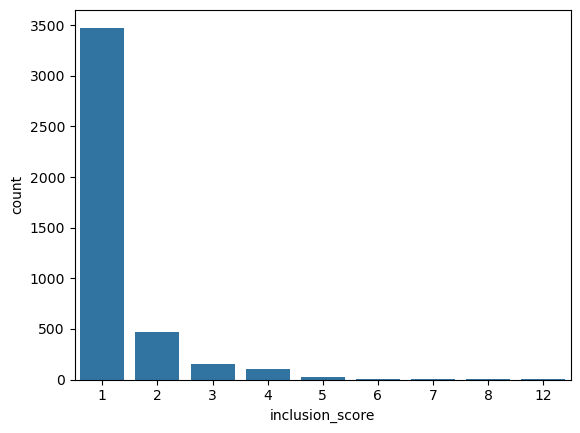

In [51]:
sns.countplot(combined_literature_chembl_w_counts, x="inclusion_score")

In [52]:
import mols2grid
mols2grid.display(combined_literature_chembl_w_counts, smiles_col="CANONICAL_SMILES")

MolGridWidget()